In [374]:
using Distributed, SharedArrays

using LinearAlgebra, SparseArrays, StatsBase, Distances, IterativeSolvers
using NearestNeighbors, OptimalTransport, MultivariateStats
using Distributed, SharedArrays
# include("util.jl")
using Plots

In [375]:
function rotate_point(x, θ)
    r = @. [[cos(θ) -sin(θ)]; 
            [sin(θ)  cos(θ)]] 

    return (r*x)'
end


rotate_point (generic function with 1 method)

In [376]:

#Make a spiral with k arms and n points per arm
# PARAM: 
# arms: array of integers, n-th entry is the number of points on n-th arm
# todo: take a function f as input for sscaling along arm
function general_kSpiral(arms; st = 0.5, ed = 5)
    total_so_far = 0
    total_pts = sum(arms)
    class_num = length(arms)
    
    #Divide a full rotation into k intervals
    θ = range(0, 2π, length = class_num+1)
    
    #Make a matrix of labels
    inds = ones(Int32, total_pts) 
    
    X = zeros(total_pts, 2)
    T = zeros(total_pts)


    for i in 1:class_num

        t = ed * rand(arms[i]) .+ st

#         t = ed * LinRange(0, 1, arms[i]).^2 .+ st
        
        sort!(t)
        
        #Plug into the parametrization for the spiral
        x = @. [cos(t) * t sin(t) * t] 

        #Rotate to give spiral effect
        X[total_so_far+1 : total_so_far + arms[i], :] = rotate_point(x', θ[i]) 
        T[total_so_far+1 : total_so_far + arms[i], :] = t

        #Label arm i as i
        inds[total_so_far+1 : total_so_far + arms[i]] .= i 

        total_so_far += arms[i]

    end
    
    return X, T, inds
end



general_kSpiral (generic function with 1 method)

In [377]:
function sample_labels(all_labels, prop)
    N = length(all_labels)
    #Sample nodes for which we assume labels are known
    label_idx = sample(1:N, Int(floor(prop*N)), replace = false) #Get the indices of the nodes
#     sort!(label_idx)
    labels = all_labels[label_idx]  #Get the corresponding labels

    return label_idx, labels
end

sample_labels (generic function with 2 methods)

In [378]:
function initialize_SSL(label_idx, labels, N, K)
    #Mark selected nodes as true, and all others false (indicator)
    given_labels = zeros(Bool, N) 
    given_labels[label_idx] .= true

    # label selection matrix
    S = sparse(label_idx, label_idx, 1.0, N, N) #A diag matrix with ones on labelled nodes
    P = sparse(label_idx, labels, 1.0, N, K) #A selection matrix where labelled cells are marked in their corresponding color colum
#     Q = rand(N, K) #A likelihood matrix for nodes being in a class
    Q = ones(N, K) #A likelihood matrix for nodes being in a class

    return given_labels, S, P, Q
end

initialize_SSL (generic function with 1 method)

In [379]:


function solve_SSL!(γ, Q, P, S, η = 8)
    #Solve the linear system for likelihood
    cg!(Q, S+η*(I-γ), P, maxiter=1000)
#     Q = Matrix(S+η*(I-γ)) \ Matrix(P) .+ 1e-10
    
    return Q
end

solve_SSL! (generic function with 2 methods)

In [380]:
function infer_labels(Q)
    _, class_num = size(Q)
    soft_label = Q*collect(1:class_num)
    inferred_label = getindex.( argmax(Q, dims=2), 2)[:]
    
    return soft_label, inferred_label
end

infer_labels (generic function with 1 method)

In [381]:
function accuracy(all_labels, ink_ind, infer_label, N)
    acc = 1- sum(abs.(labels_all[.!ink_ind]-infer_label[.!ink_ind]) .>0)/(N-sum(ink_ind))

    return acc
end

accuracy (generic function with 1 method)

In [382]:
function predict_label(γ, label_idx, labels, N, K)

    given_labels, S, P, Q = initialize_SSL(label_idx, labels, N, K)
    
    Q = solve_SSL!(γ, Q, P, S)
    
    _, inferred_label = infer_labels(Q)    
    
    return Q, inferred_label
end

predict_label (generic function with 1 method)

In [383]:

function kNN_Weight(X, k, σ = 0.5)
    
    N = size(X)[1]
    knn_idxs, knn_dists = knn( KDTree(X'), X', k, true)

    # adjacency matrix
    inds = vcat(Int.(ones(k)*collect(1:N)')...)
    A = sparse(inds, vcat(knn_idxs...), 1, N, N)

    inds_sym = A+A'.>0
    K = spzeros(N, N)
#     σ = 0.5
#     TODO: vary \sigma
    C = pairwise(SqEuclidean(), X, X, dims=1)
    K[inds_sym] = exp.(-C[inds_sym].^2 / σ)

    d = spdiagm(0 => sum(K, dims=1)[1, :].^(-1))

    return d*K
end


kNN_Weight (generic function with 2 methods)

In [384]:
function QOT_weight(X, ε)
    N, class_num = size(X)
    C = pairwise(SqEuclidean(), X, X, dims=1) #Euclidean distance between nodes
    C[diagind(C)] .= Inf #No self edges allowed
    
    return quadreg(ones(N), ones(N), C, ε)
end

QOT_weight (generic function with 1 method)

In [385]:
function ENT_weight(X, ε)
    N, class_num = size(X)
    C = pairwise(SqEuclidean(), X, X, dims=1) #Euclidean distance between nodes
    C[diagind(C)] .= Inf #No self edges allowed
    
    return sinkhorn(ones(N), ones(N), C, ε)
end

ENT_weight (generic function with 1 method)

In [386]:
K = 6
arms = ones(K)
N_arm = 200
arms = @. Int(floor(N_arm * arms))
N = sum(arms)

X, T, all_labels = general_kSpiral(arms; st = 0.5, ed = 5)

X += 0.2*rand(N, 2)

prop = 0.1
label_idx, labels = sample_labels(all_labels, prop)

([965, 328, 605, 999, 383, 107, 235, 914, 284, 635  …  592, 931, 503, 960, 491, 998, 1089, 455, 1114, 726], Int32[5, 2, 4, 5, 2, 1, 2, 5, 2, 4  …  3, 5, 3, 5, 3, 5, 6, 3, 6, 4])

In [387]:
C = pairwise(SqEuclidean(), X, X, dims=1)

ε_qot = 0.05*mean(C)
γ_qot = QOT_weight(X, ε_qot)


ε_ent = 0.001*mean(C)
γ_ent = ENT_weight(X, ε_ent)

k = 6
σ = ε_ent
γ_knn = kNN_Weight(X, k, σ)

┌ Warning: Semi-smooth Newton algorithm (100/100): not converged
└ @ OptimalTransport /zfs/users/tmats/tmats/.julia/packages/OptimalTransport/R8czE/src/quadratic_newton.jl:216
┌ Warning: Sinkhorn algorithm (1000/1000): not converged
└ @ OptimalTransport /zfs/users/tmats/tmats/.julia/packages/OptimalTransport/R8czE/src/entropic/sinkhorn_solve.jl:101


1200×1200 SparseMatrixCSC{Float64, Int64} with 8250 stored entries:
⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⠀⠀⠀⠀⠀⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠠⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠄⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠁⠀⠀⠀⠈⠻⣦

In [388]:
Q_qot, qot_inferred_label = predict_label(γ_qot, label_idx, labels, N, K)

Q_ent, ent_inferred_label = predict_label(γ_ent, label_idx, labels, N, K)

Q_knn, knn_inferred_label = predict_label(γ_knn, label_idx, labels, N, K)

# accuracy(all_labels, given_labels, inferred_label, N)

([0.9999999999999989 -3.584342587852352e-8 … -3.584342587852352e-8 -3.584342587852352e-8; 0.9999999999999982 -3.6383042425528404e-8 … -3.6383042425528404e-8 -3.6383042425528404e-8; … ; -4.5329361509733785e-9 -4.5329361509733785e-9 … -4.5329361509733785e-9 0.9999999999999981; -4.591696743500156e-9 -4.591696743500156e-9 … -4.591696743500156e-9 0.9999999999999983], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  6, 6, 6, 6, 6, 6, 6, 6, 6, 6])

In [389]:
println(sum(Q_qot))
println(sum(Q_ent))

1215.000000883437
1231.0548740020433


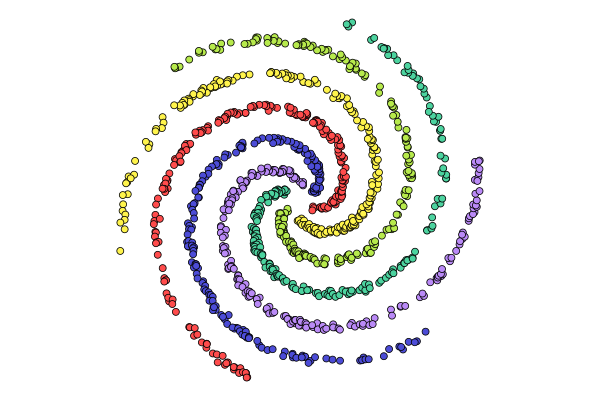

In [390]:

hd = scatter(X[:, 1], X[:, 2], marker_z = all_labels, alpha=1.0, 
    c = :lighttest, ticks = nothing, leg=false, showaxis=false, aspect_ratio=1.0)

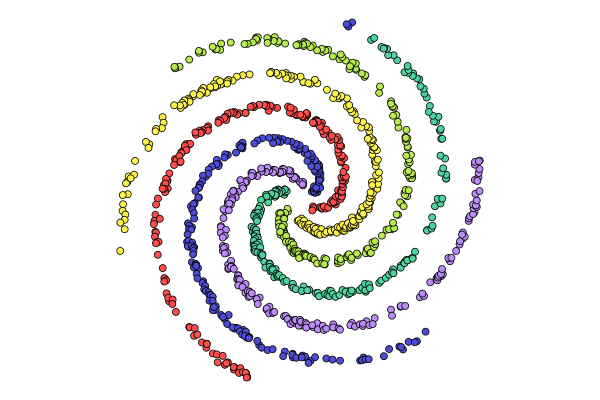

In [391]:

hd = scatter(X[:, 1], X[:, 2], marker_z = qot_inferred_label, alpha=1.0, 
    c = :lighttest, ticks = nothing, leg=false, showaxis=false, aspect_ratio=1.0)

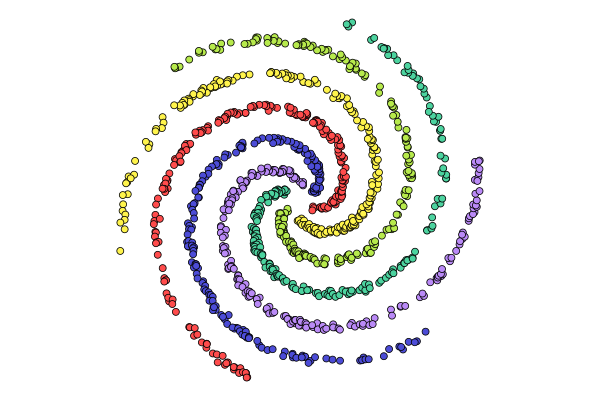

In [392]:

hd = scatter(X[:, 1], X[:, 2], marker_z = ent_inferred_label, alpha=1.0, 
    c = :lighttest, ticks = nothing, leg=false, showaxis=false, aspect_ratio=1.0)

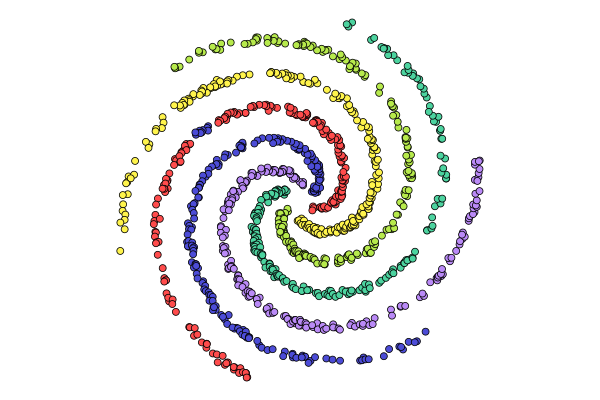

In [393]:

hd = scatter(X[:, 1], X[:, 2], marker_z = knn_inferred_label, alpha=1.0, 
    c = :lighttest, ticks = nothing, leg=false, showaxis=false, aspect_ratio=1.0)

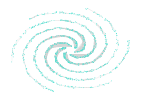

In [394]:
using LightGraphs, GraphPlot

G_qot = LightGraphs.Graph(γ_qot+γ_qot')
gp_qot = gplot(G, X[:,1], -X[:,2])

In [395]:
# spy(γ_qot)
sum(γ_qot .>0)

13766

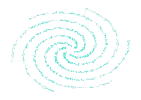

In [396]:

G_knn = LightGraphs.Graph(γ_knn+γ_knn')
gp_knn = gplot(G_knn, X[:,1], -X[:,2])

In [397]:
# println(sum(Q_ent, dims=2) .==0.25)
# println(Matrix(Q_ent))
idx = γ_ent .< 1e-4
γ_ent[idx] .= 0

sum(γ_ent .>0)
# spy(γ_ent)

14814

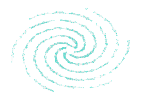

In [398]:
G_ent = LightGraphs.Graph(γ_ent+γ_ent')
gp_ent = gplot(G_ent, X[:,1], -X[:,2])